<h2 align=center>Generate Synthetic Images with DCGANs</h2>

Project Overview and Import Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

## Hyperparameters

In [3]:
latent_size = 100
img_size = 64
batch_size = 64
lr = 0.0002
b1 = 0.5
b2 = 0.999
n_epochs = 25

## Define the generator network

In [4]:

class Generator(nn.Module):
    def __init__(self, latent_size, img_size):
        super(Generator, self).__init__()
        self.fc = nn.Linear(latent_size, 128 * (img_size // 4) ** 2)
        self.conv = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 3, 3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        out = self.fc(z)
        out = out.view(out.shape[0], 128, (self.img_size // 4), (self.img_size // 4))
        img = self.conv(out)
        return img


## Define the discriminator network

In [5]:
class Discriminator(nn.Module):
    def __init__(self, img_size):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            nn.Conv2d(3, 32, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.Conv2d(32, 64, 3, stride=2, padding=1),
            nn.ZeroPad2d((0, 1, 0, 1)),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
            nn.Conv2d(128, 256, 3, stride=1, padding=0),
            nn.Sigmoid()
        )

    def forward(self, img):
        validity = self.model(img)
        return validity

In [6]:
# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Initialize generator and discriminator

In [7]:
generator = Generator(latent_size, img_size).to(device)
discriminator = Discriminator(img_size).to(device)

## Optimizers

In [8]:
optimizer_G = optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

## Binary Cross-Entropy loss function

In [9]:
adversarial_loss = nn.BCELoss()

## Generate random noise

In [10]:
fixed_noise = torch.randn(64, latent_size, device=device)

## Load and Preprocess data

In [11]:
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Root directory for dataset
dataroot = "datasets/birds/train"

# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(img_size),
                               transforms.CenterCrop(img_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=2)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

## Training loop

In [ ]:

for epoch in range(n_epochs):
    for i, (imgs, _) in enumerate(dataloader):
            # Move data to GPU
        real_imgs = imgs.to(device)
        batch_size = real_imgs.size(0)

        # Train the discriminator
        optimizer_D.zero_grad()

        # Real images
        validity_real = discriminator(real_imgs)
        print(real_imgs.shape)
        print(validity_real.shape)
        d_loss_real = adversarial_loss(validity_real, torch.ones(batch_size, device=device))
        d_loss_real.backward()

        # Fake images
        z = torch.randn(batch_size, latent_size, device=device)
        fake_imgs = generator(z)
        validity_fake = discriminator(fake_imgs.detach())
        d_loss_fake = adversarial_loss(validity_fake, torch.zeros(batch_size, device=device))
        d_loss_fake.backward()

        d_loss = d_loss_real + d_loss_fake
        optimizer_D.step()

        # Train the generator
        optimizer_G.zero_grad()

        z = torch.randn(batch_size, latent_size, device=device)
        fake_imgs = generator(z)
        validity = discriminator(fake_imgs)
        g_loss = adversarial_loss(validity, torch.ones(batch_size, device=device))
        g_loss.backward()
        optimizer_G.step()

        print(f"[Epoch {epoch}/{n_epochs}] [Batch {i}/{len(dataloader)}] [D loss: {d_loss.item()}] [G loss: {g_loss.item()}]")

# Generate and save samples after each epoch
with torch.no_grad():
    fake_imgs = generator(fixed_noise)
    save_image(fake_imgs.cpu(), f"images/{epoch}.png")


torch.Size([786432])


## Images Comparison

In [ ]:
# Plot real and fake images
real_images = next(iter(dataloader))[0][:64]
with torch.no_grad():
    fake_images = generator(torch.randn(64, latent_size, device=device))
    
grid_real = make_grid(real_images, padding=2)
grid_fake = make_grid(fake_images, padding=2)

plt.figure(figsize=(15,5))
plt.imshow(np.transpose(grid_real.numpy(), (1, 2, 0)))
plt.axis("off")
plt.title("Real Images")

plt.figure(figsize=(15,5))
plt.imshow(np.transpose(grid_fake.cpu().numpy(), (1, 2, 0)))
plt.axis("off")
plt.title("Generated Images")

plt.show()

## Compute MSE

In [ ]:
# Compute mean squared error
mse = nn.MSELoss()
with torch.no_grad():
    loss = mse(real_images, fake_images)
print(f"MSE: {loss.item()}")

## Compute SSIM

In [ ]:
# Compute structural similarity index
ssim = pytorch_ssim.SSIM(window_size=11)
with torch.no_grad():
    ssim_loss = 1 - ssim(real_images, fake_images).mean()
print(f"SSIM: {ssim_loss.item()}")


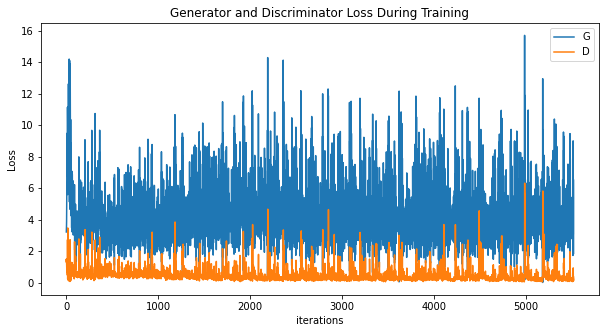

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Task 8: Generate Synthetic Images with DCGAN

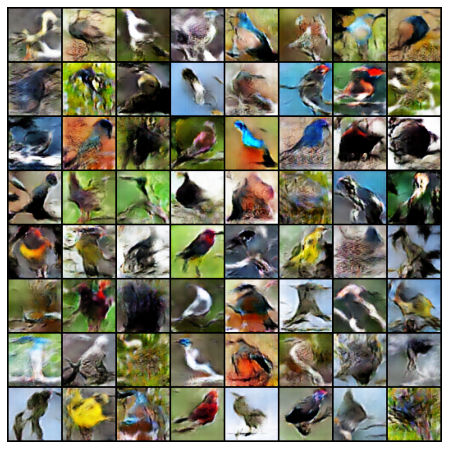

In [ ]:
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import rcParams
rcParams['animation.embed_limit'] = 2**8
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

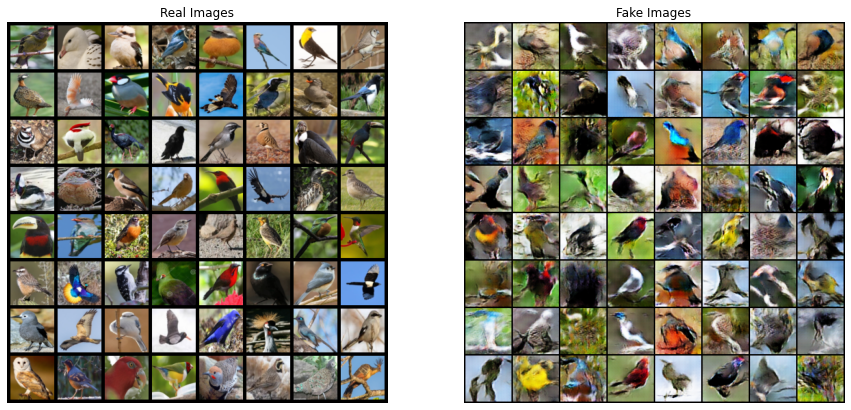

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [ ]:
ani.save('bird_generation_chatGPT.gif', writer='imagemagick', fps=60)

"ani.save('bird_generation.gif', writer='imagemagick', fps=60)"

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


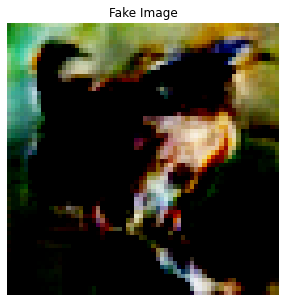

In [ ]:
noise = torch.randn(1, nz, 1, 1, device=device)
        # Generate fake image batch with G
fake = genModel(noise).detach().cpu()
plt.figure(figsize=(5,5))
plt.axis("off")
plt.title("Fake Image")
plt.imshow(np.transpose(fake[-1],(1,2,0)))